In [518]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

In [519]:
"""
amount_tsh : Total static head (amount water available to waterpoint)
date_recorded : The date the row was entered
funder : Who funded the well
gps_height : Altitude of the well
installer : Organization that installed the well
longitude : GPS coordinate
latitude : GPS coordinate
wpt_name : Name of the waterpoint if there is one
num_private :Private use or not
basin : Geographic water basin
subvillage : Geographic location
region : Geographic location
region_code : Geographic location (coded)
district_code : Geographic location (coded)
lga : Geographic location
ward : Geographic location
population : Population around the well
public_meeting : True/False
recorded_by : Group entering this row of data
scheme_management : Who operates the waterpoint
scheme_name : Who operates the waterpoint
permit : If the waterpoint is permitted
construction_year : Year the waterpoint was constructed
extraction_type : The kind of extraction the waterpoint uses
extraction_type_group : The kind of extraction the waterpoint uses
extraction_type_class : The kind of extraction the waterpoint uses
management : How the waterpoint is managed
management_group : How the waterpoint is managed
payment : What the water costs
payment_type : What the water costs
water_quality : The quality of the water
quality_group : The quality of the water
quantity : The quantity of water
quantity_group : The quantity of water
source : The source of the water
source_type : The source of the water
source_class : The source of the water
waterpoint_type : The kind of waterpoint
waterpoint_type_group : The kind of waterpoint"""



#pd.set_option('display.max_columns', None)  
df = pd.read_csv('data/water_table.csv')
labels = pd.read_csv('data/water_table_labels.csv')

In [520]:
df.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [521]:
labels.head()

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional


In [522]:
df['target']= labels['status_group']

In [523]:
df.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,target
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


In [524]:
df.target.value_counts()

functional                 32259
non functional             22824
functional needs repair     4317
Name: target, dtype: int64

In [525]:
df.shape

(59400, 41)

In [526]:
df['target'] = df['target'].map({'functional':0,'non functional':1,'functional needs repair':2})
df.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,target
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,0
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,0
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,0
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,1
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,0


#### Target

0    32259
1    22824
2     4317
Name: target, dtype: int64


0    0.543
1    0.384
2    0.073
Name: target, dtype: float64
---------------------------------------------


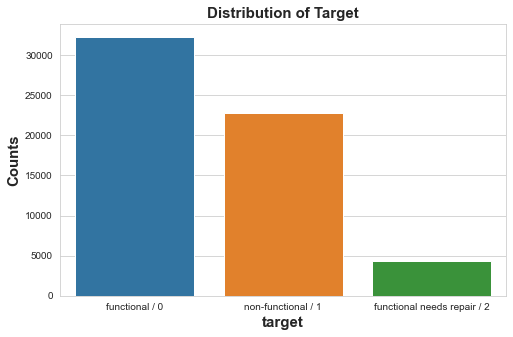

In [527]:
def target_distribution(data, col = None,ticklabels=None, hist_kws=None, kde_kws={'color':'red'}, figsize=None):
    """
    plots a seaborn distplot for column w/customization
    Args
    df (df)
    col (int)
    hist_kws (dict)
    figsize (dict)
    
    """
    print(data[col].value_counts(dropna=False))
    print('\n')
    print(round(data[col].value_counts(normalize=True),3))
    dashes = dashes='---'*15
    print(dashes)
    
    if hist_kws == None:
        {'alpha':0.5,'edgecolor':'black'}

    #order = pd.crosstab(data[col].sort_values('Classic', ascending=False).index

    fig,ax = plt.subplots(figsize=figsize)
    sns.countplot(data[col], ax=ax)

    label_font = {'weight':'bold','size':15}
    ax.set_ylabel('Counts',fontdict=label_font)
    ax.set_xlabel(col,fontdict=label_font)
    ax.set_title(f'Distribution of {col.title()}',fontdict=label_font)
    ax.set_xticklabels(ticklabels)

target_distribution(df, col='target', ticklabels=['functional / 0','non-functional / 1','functional needs repair / 2'],figsize=(8,5))

### Null Values

In [528]:
df.isna().sum()

id                           0
amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

In [529]:
series_nan = round(df.isna().sum() / len(df),4) * 100
series_nan

id                        0.00
amount_tsh                0.00
date_recorded             0.00
funder                    6.12
gps_height                0.00
installer                 6.15
longitude                 0.00
latitude                  0.00
wpt_name                  0.00
num_private               0.00
basin                     0.00
subvillage                0.62
region                    0.00
region_code               0.00
district_code             0.00
lga                       0.00
ward                      0.00
population                0.00
public_meeting            5.61
recorded_by               0.00
scheme_management         6.53
scheme_name              47.42
permit                    5.14
construction_year         0.00
extraction_type           0.00
extraction_type_group     0.00
extraction_type_class     0.00
management                0.00
management_group          0.00
payment                   0.00
payment_type              0.00
water_quality             0.00
quality_

In [530]:
"""
(59400, 41)

funder                    3635
gps_height                   0

subvillage                 371

public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056

"""
print('NaN')

NaN


In [531]:
from sklearn.impute import SimpleImputer
imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')

#### Funder

In [532]:
df['funder'].value_counts(dropna=False)

Government Of Tanzania            9084
NaN                               3635
Danida                            3114
Hesawa                            2202
Rwssp                             1374
World Bank                        1349
Kkkt                              1287
World Vision                      1246
Unicef                            1057
Tasaf                              877
District Council                   843
Dhv                                829
Private Individual                 826
Dwsp                               811
0                                  777
Norad                              765
Germany Republi                    610
Tcrs                               602
Ministry Of Water                  590
Water                              583
Dwe                                484
Netherlands                        470
Hifab                              450
Adb                                448
Lga                                442
Amref                    

In [533]:
#pd.set_option('display.max_rows', None)
funder_null = df[df['funder'].isnull()]
funder_null

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,target
34,41583,0.0,2011-02-23,NaN,-41,NaN,39.812912,-7.889986e+00,Msikitini Wa Ijumaa,0,...,salty,salty,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,0
43,19282,0.0,2013-01-15,NaN,1642,NaN,34.967789,-4.628921e+00,Mvae Primary,0,...,unknown,unknown,dry,dry,machine dbh,borehole,groundwater,communal standpipe,communal standpipe,1
47,13620,0.0,2011-07-27,NaN,0,NaN,33.540607,-9.172905e+00,Mahakamani,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,0
65,51072,0.0,2013-02-09,NaN,1415,NaN,34.621598,-5.173136e+00,Nyambi,0,...,unknown,unknown,dry,dry,machine dbh,borehole,groundwater,communal standpipe,communal standpipe,1
71,17386,0.0,2011-03-31,NaN,0,NaN,34.462228,-8.575780e+00,Kwa Manyusi Mlilo,0,...,soft,good,insufficient,insufficient,river,river/lake,surface,communal standpipe,communal standpipe,1
72,41609,0.0,2011-04-04,NaN,0,NaN,34.247180,-8.607513e+00,Kwa Mzee Mwalongo,0,...,soft,good,seasonal,seasonal,river,river/lake,surface,communal standpipe,communal standpipe,1
75,62971,0.0,2011-08-07,NaN,0,NaN,31.796873,-1.351486e+00,Kwa Jackson,0,...,soft,good,insufficient,insufficient,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,1
109,7116,0.0,2011-07-12,NaN,0,NaN,33.805081,-9.130674e+00,Kwa Mzee Kaiga,0,...,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,0
124,14016,0.0,2011-04-07,NaN,0,NaN,33.873104,-9.290616e+00,Busekele,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,0
126,73061,50.0,2013-02-14,NaN,1455,NaN,34.710643,-5.186766e+00,Aley Mak8Ta,0,...,soft,good,insufficient,insufficient,machine dbh,borehole,groundwater,communal standpipe,communal standpipe,0


In [534]:
"""
pivoting features
analyze our feature corelations by pivoting features against each other
no NaN
for features which are categorical (Sex), ordinal (Pclass) or discrete (SibSp, Parch) type

functional:0,
non functional:1,
functional needs repair:2
"""

df[["funder", "target"]].groupby(['funder'], as_index=False).mean().sort_values(
        by='target', ascending=False)

,funder,target
857,Magereza,2.000000
51,Agt Church,2.000000
822,Lotary Club,2.000000
1614,Tanload,2.000000
1820,Wamisionari Wa Kikatoriki,2.000000
463,Grail Mission Kiseki Bar,2.000000
1196,Others,2.000000
705,Kilimo,2.000000
1793,Villegers,2.000000
959,Mhuzu,2.000000


#### Installer

In [535]:

installer = df[["installer", "target"]].groupby(['installer'], as_index=False).mean().sort_values(
        by='target', ascending=False)

installer

,installer,target
439,E ETO,2.000000
1441,RC Msufi,2.000000
680,ISF and TACARE,2.000000
81,Africaone,2.000000
683,ISSAA KANYANGE,2.000000
1659,Shule ya msingi,2.000000
1348,Others,2.000000
815,KKKT Ndrumangeni,2.000000
1236,Mzee Salum Bakari Darus,2.000000
1423,Quik,2.000000


In [536]:
installer_num = df.groupby(['installer', 'target'])['installer'].count().unstack() #.fillna(0)
installer_num

target,0,1,2
installer,,,
-,2.0,1.0,NaN
0,445.0,329.0,3.0
A.D.B,NaN,NaN,1.0
AAR,NaN,2.0,2.0
ABASIA,23.0,4.0,2.0
ABD,1.0,NaN,NaN
ABDALA,NaN,1.0,NaN
ABDUL,NaN,1.0,NaN
AC,2.0,NaN,NaN


#### date_recorded

In [537]:
#date_recorded 
df['date_recorded'].dtype

dtype('O')

In [538]:
df['year'] = pd.DatetimeIndex(df['date_recorded']).year

In [539]:
print(df['year'].dtype)
#year = df['year']

int64


In [540]:
df['year'].describe()

count    59400.000000
mean      2011.921667
std          0.958758
min       2002.000000
25%       2011.000000
50%       2012.000000
75%       2013.000000
max       2013.000000
Name: year, dtype: float64

In [541]:
years = df['year'].value_counts(dropna=False)
years

2011    28674
2013    24271
2012     6424
2004       30
2002        1
Name: year, dtype: int64

2011    28674
2013    24271
2012     6424
2004       30
2002        1
Name: year, dtype: int64


2011    0.483
2013    0.409
2012    0.108
2004    0.001
2002    0.000
Name: year, dtype: float64
---------------------------------------------


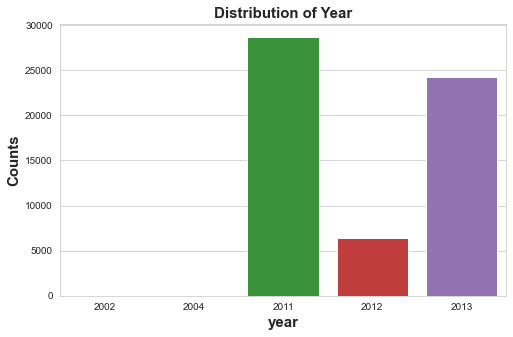

In [542]:
# def distribution_visualization(data, col = None,hist_kws=None, kde_kws={'color':'red'}, figsize=(8,4)):
    
#     if hist_kws == None:
#         {'alpha':0.5,'edgecolor':'black'}

#     #order = pd.crosstab(data[col].sort_values('Classic', ascending=False).index

#     fig,ax = plt.subplots(figsize=figsize)
#     sns.countplot(data[col], ax=ax)

#     label_font = {'weight':'bold','size':15}
#     ax.set_ylabel('Counts',fontdict=label_font)
#     ax.set_xlabel(col,fontdict=label_font)
#     ax.set_title(f'Distribution of {col.title()}',fontdict=label_font)
   
# distribution_visualization(df, col='year')
def target_distribution(data, col = None,ticklabels=None, hist_kws=None, kde_kws={'color':'red'}, figsize=None):
    """
    plots a seaborn distplot for column w/customization
    Args
    df (df)
    col (int)
    hist_kws (dict)
    figsize (dict)
    
    """
    print(data[col].value_counts(dropna=False))
    print('\n')
    print(round(data[col].value_counts(normalize=True),3))
    dashes = dashes='---'*15
    print(dashes)
    
    if hist_kws == None:
        {'alpha':0.5,'edgecolor':'black'}

    #order = pd.crosstab(data[col].sort_values('Classic', ascending=False).index

    fig,ax = plt.subplots(figsize=figsize)
    sns.countplot(data[col], ax=ax)

    label_font = {'weight':'bold','size':15}
    ax.set_ylabel('Counts',fontdict=label_font)
    ax.set_xlabel(col,fontdict=label_font)
    ax.set_title(f'Distribution of {col.title()}',fontdict=label_font)
    #ax.set_xticklabels(ticklabels)

target_distribution(df, col='year', figsize=(8,5))

In [543]:
df[df['year'] == 2004]

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,target,year
762,3995,0.0,2004-08-01,Dhv Moro,277,DWE,36.516088,-8.097199,Hospital,0,...,unknown,unknown,unknown,shallow well,shallow well,groundwater,hand pump,hand pump,1,2004
1189,20122,0.0,2004-12-01,Cct,777,Regional Water,39.130087,-10.572385,Kwa Mzee Mkata,0,...,good,enough,enough,spring,spring,groundwater,other,other,1,2004
3446,53174,0.0,2004-08-01,Hesawa,1362,HESAWA,34.516282,-1.732201,Musati Primary School Dp No.7,0,...,good,enough,enough,spring,spring,groundwater,communal standpipe multiple,communal standpipe,1,2004
8729,20198,0.0,2004-05-01,Government Of Tanzania,86,DWE,38.959776,-5.247278,Kwa Bi Shoga,0,...,salty,dry,dry,shallow well,shallow well,groundwater,hand pump,hand pump,1,2004
8736,19591,0.0,2004-04-05,Government Of Tanzania,0,Central Government,33.657666,-8.990526,Kwa Ali Majani,0,...,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,1,2004
10441,55069,20.0,2004-12-01,Plan Int,307,DDCA,38.768656,-7.298419,Mianzi Primary School,0,...,good,enough,enough,spring,spring,groundwater,hand pump,hand pump,1,2004
13366,48759,100.0,2004-06-01,Mgaya,1331,Mgaya,34.290885,-1.699609,Maro Mgaya,0,...,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,0,2004
14697,42443,0.0,2004-12-01,H,0,H,32.967792,-2.398956,Kwa Amosi,0,...,good,insufficient,insufficient,shallow well,shallow well,groundwater,other,other,1,2004
15103,35841,0.0,2004-12-01,Government Of Tanzania,0,RWE,31.757089,-1.044372,Kwantanda,0,...,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe,1,2004
16468,35238,0.0,2004-12-01,Tcrs,0,TCRS,33.806560,-3.830578,Kwa Daudi,0,...,good,insufficient,insufficient,river,river/lake,surface,communal standpipe multiple,communal standpipe,0,2004


spring                  17021
shallow well            16824
machine dbh             11075
river                    9612
rainwater harvesting     2295
hand dtw                  874
lake                      765
dam                       656
other                     212
unknown                    66
Name: source, dtype: int64


spring                  0.287
shallow well            0.283
machine dbh             0.186
river                   0.162
rainwater harvesting    0.039
hand dtw                0.015
lake                    0.013
dam                     0.011
other                   0.004
unknown                 0.001
Name: source, dtype: float64
---------------------------------------------


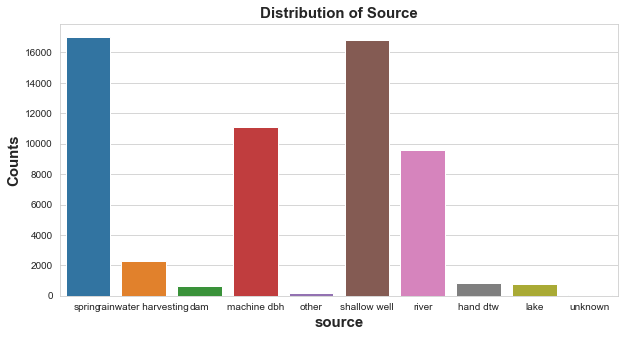

In [544]:
target_distribution(df, col='source', figsize=(10,5))

In [545]:

def count_plot(dataframe,target, ocol,lcol):
    print(dataframe[target].value_counts())
    print('\n')
    print(dataframe[target].value_counts(normalize=True))
    dashes = dashes='---'*15
    print(dashes)
    
    fig,ax = plt.subplots(figsize=(6,6,))
    fig.figsize=[5,5]
    sns.countplot(x=target, data=dataframe, palette="bwr")
    ax.set_title(f'# of Passengers that {ocol}/{lcol}')
    ax.set_xticklabels(['Died / 0', 'Survived / 1'])
    plt.show()
    return ax

#executing with arguments
#,ocol='Died',lcol='Survived'
#axer = count_plot(dataframe=data,target='Survived',ocol='Died',lcol='Survived');

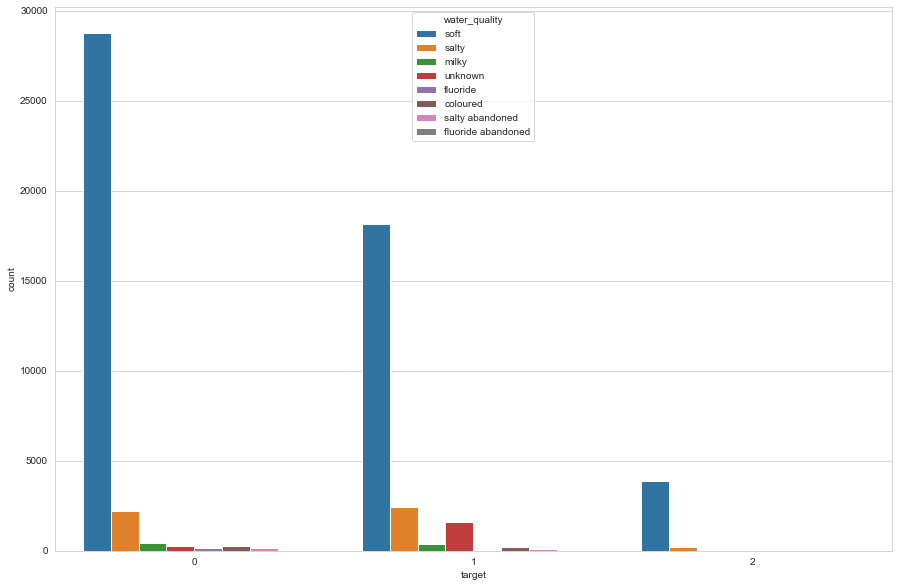

In [546]:
import seaborn as sns
"""
plt.figure(figsize=(10,10))
sns.countplot(x='target', data=df, palette="bwr")
sns.countplot(x='water_quality', data=df, palette="bwr")
"""
plt.figure(figsize=(15,10))
sns.countplot(x='target', hue='water_quality', data=df)


In [547]:
df_data = df.copy()

In [548]:
df_data = df_data.dropna()

In [549]:
df_data.shape

(27813, 42)

In [550]:
df_data.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,target,year
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,0,2011
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,0,2013
5,9944,20.0,2011-03-13,Mkinga Distric Coun,0,DWE,39.172796,-4.765587,Tajiri,0,...,salty,enough,enough,other,other,unknown,communal standpipe multiple,communal standpipe,0,2011
13,50495,0.0,2013-03-15,Lawatefuka Water Supply,1368,Lawatefuka water sup,37.092574,-3.181783,Kwa John Izack Mmari,0,...,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,0,2013
14,53752,0.0,2012-10-20,Biore,0,WEDECO,34.364073,-3.629333,Mwabasabi,0,...,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,0,2012


In [551]:
"""
charts:
scatter
line plots
barplots
histograms
boxplots
kernel density examination plots
violin plots
"""

'\ncharts:\nscatter\nline plots\nbarplots\nhistograms\nboxplots\nkernel density examination plots\nviolin plots\n'

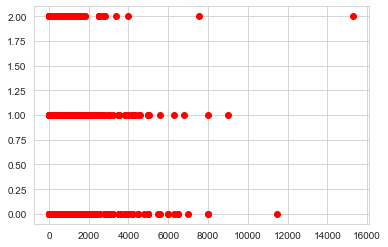

In [552]:
"""
scatter
maplotlib
population on horizontal
target on vertical
"""
plt.plot(df_data['population'],df_data['target'], 'ro');

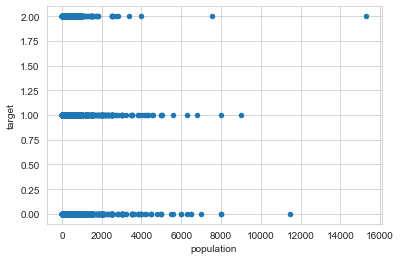

In [553]:
#pandas

df_data.plot(kind='scatter',x='population',y='target')

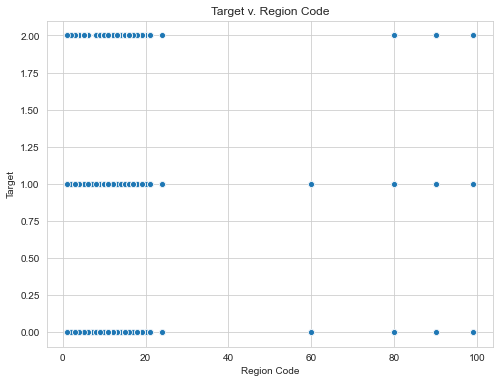

In [554]:
"""
fig,ax = plt.subplots(figsize=(6,6))
    #fig.figsize=[5,5]
    sns.countplot(x=target, data=dataframe, palette="bwr")
    ax.set_title(f'# of Passengers that {ocol}/{lcol}')
    ax.set_xticklabels(['Died / 0', 'Survived / 1'])

scatter plots showht relationship between 2 variables in the for mdots on the plot.
value along horizontal axis are plotted against a vertical axis.
Lots of data that's not ordered in any way
"""

fig,ax = plt.subplots(figsize=(8,6))
#df_data.plot(kind='scatter',x='region_code',y='target')
sns.scatterplot(x='region_code',y='target',data=df_data)
ax.set_title('Target v. Region Code')
ax.set_xlabel('Region Code');
ax.set_ylabel('Target');


In [555]:
"""
line plot are similar to point plots,
line plots the discrete points are connected by lines 
time series-where order matters.
"""
print('line plot?')

line plot?


In [556]:
"""
bar plots- used to display the counts of unique values of catergorical variable
height of bar represents the count for each unique category of variable
"""
counts = df_data['region'].value_counts()
counts

Iringa           4459
Kilimanjaro      4053
Arusha           2563
Tanga            1850
Kigoma           1778
Morogoro         1557
Dodoma           1403
Kagera           1154
Pwani            1143
Ruvuma           1121
Mwanza            897
Mbeya             870
Mtwara            861
Manyara           856
Shinyanga         783
Lindi             573
Rukwa             566
Singida           498
Tabora            451
Mara              325
Dar es Salaam      52
Name: region, dtype: int64

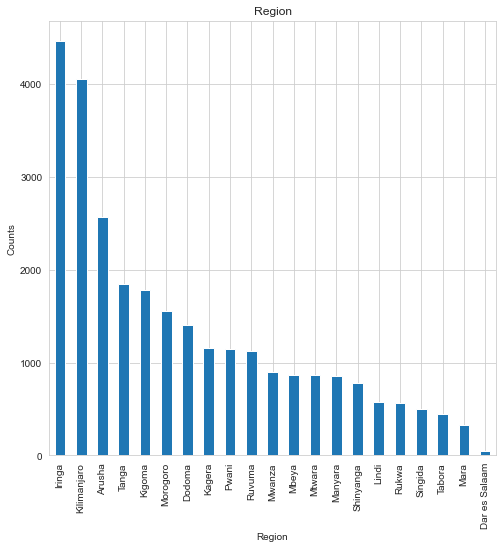

In [557]:
"""
what is in each region
barplot-best to order it, ie descending

barplot = discrete or categroical data, ie, the name of cars from list, toyota, volvo
    they are discrete. A car can't be 1.2 Toyota.
"""

fig = plt.figure(figsize=(8,8))
ax = fig.gca()
counts.plot.bar(ax=ax)
ax.set_title('Region')
ax.set_xlabel('Region')
ax.set_ylabel('Counts');

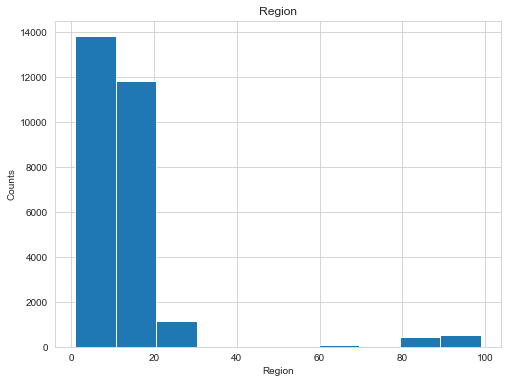

In [558]:
"""
histogram-related to barplot.
histogram used for numeric variables-shows the number of data w/vlaues witinh a bin
    The bin divdes the values of the variables into equal segments.
    Vertical axis of histogrtam shows the count of data value w/in eahc bin.
barplot shows the counts of unique categories 

histogram = numeric variables
Histogram - It's continous variable, not a categorical variable, ie engine size are in cubic inches.
    no categorical. ie, engine can have 1.45 cubic inches or 144 cubinc inches
    
creates count around bins    
"""
fig = plt.figure(figsize=(8,6))
ax = fig.gca()
df_data['region_code'].plot.hist(ax=ax)
ax.set_title('Region')
ax.set_xlabel('Region')
ax.set_ylabel('Counts');

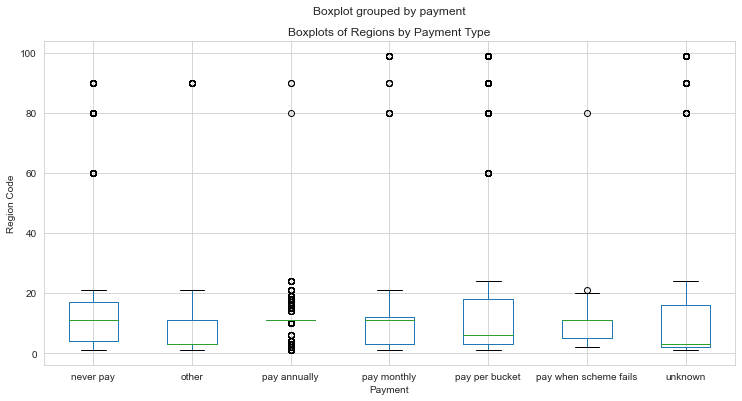

In [559]:
"""
boxplot- visualize the distribution of data values
    Are comparable to histograms

median value is shown with dark bar
The inner 2 quartiles of data values are contained w/in the box.

Outliers are shown by symbols beyond the whiskers
the distribution of engine size by fuel type
Is there overlap in inter-quartile range (the range w/in the box)

engine size-continuos
fuel type-categorical (car has gasonline or diesel)
group cars fuel type
"""
fig = plt.figure(figsize=(12,6))
ax = fig.gca()
#         engine -size, fuel type              fuel type
df_data[['region_code','payment']].boxplot(by='payment',ax=ax)
ax.set_title('Boxplots of Regions by Payment Type')
ax.set_xlabel('Payment')
ax.set_ylabel('Region Code');

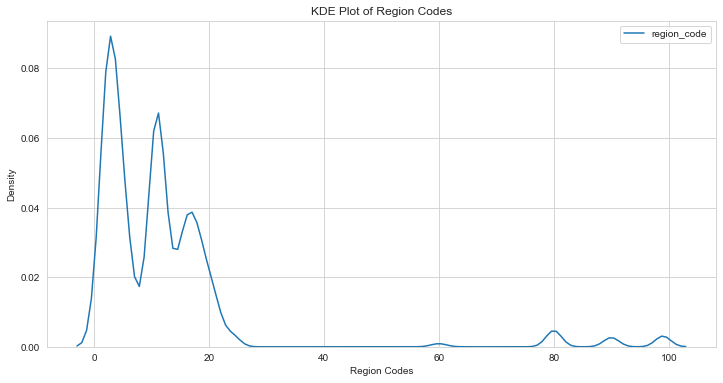

In [560]:
"""
kernal density plot-similar to histogram. 
    Displays the values of a smoothed density curve of the data values.
    Is a smoothed version of a histgram.

"""
import seaborn as sns

fig = plt.figure(figsize=(12,6))
ax = fig.gca()
sns.set_style('whitegrid')
sns.kdeplot(df_data['region_code'])
ax.set_title('KDE Plot of Region Codes')
ax.set_xlabel('Region Codes')
ax.set_ylabel('Density');

In [561]:
"""
engine_size and price
is there overplotting use this, ie engine size v. price
Before couldn't tell how many were 1 on top of each other-called overplotting

fig = plt.figure(figsize=(12,6))
ax = fig.gca()
sns.set_style('whitegrid')
sns.kdeplot(df_data[['engine_size','price']], ax=ax, cmap='Blues_d')
ax.set_title('KDE Plot of autoengine size and price')
ax.set_xlabel('Region Codes')
ax.set_ylabel('Density');


"""
print('notes')

notes


In [562]:
"""
sns.lmplot(x='city_mpg',y='price'
       data='autoprices',hue='fuel_type', palette='Set2','fit_reg=False')
#price v miles per gallon     
#shows you get more mpg for diesel cars
"""

"\nsns.lmplot(x='city_mpg',y='price'\n       data='autoprices',hue='fuel_type', palette='Set2','fit_reg=False')\n#price v miles per gallon     \n#shows you get more mpg for diesel cars\n"

In [563]:
"""
jpointplot-2 displots for bivariate data
combine 2 distribution plots
compare distribution of total bill vs. tip size
2 distribution plots
as you go higher in total bill you get higher tip. 
kde-shows density of where points match up the most.
default is scatter
"""
#sns.jointplot(x='total_bill',y='tip',data=tips,kind='kde')

'\njpointplot-2 displots for bivariate data\ncombine 2 distribution plots\ncompare distribution of total bill vs. tip size\n2 distribution plots\nas you go higher in total bill you get higher tip. \nkde-shows density of where points match up the most.\ndefault is scatter\n'

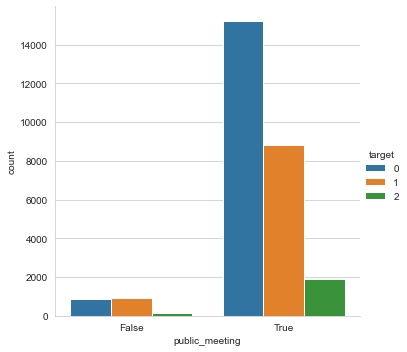

In [564]:
"""
pairplots are fo all numerical columns

"""
sns.catplot(x ="public_meeting", hue ="target",  
kind ="count", data = df_data); 

[Text(0, 0, 'works'), Text(0, 0, 'non-funciton'), Text(0, 0, 'needs repair')]

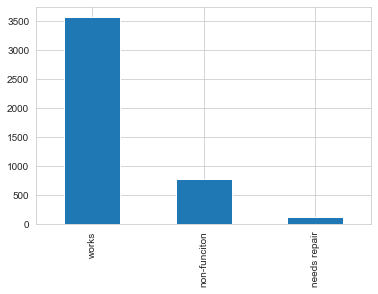

In [565]:
ax = df_data[df_data['region']== 'Iringa']['target'].value_counts().plot(kind='bar')
ax.set_xticklabels(['works','non-funciton','needs repair'])

[Text(0, 0, 'works'), Text(0, 0, 'non-funciton'), Text(0, 0, 'needs repair')]

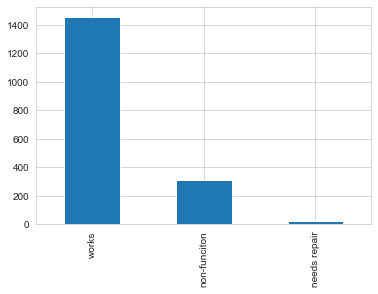

In [566]:
"""
it is skewed towards works

"""

ax = df_data[(df_data['region']== 'Iringa') & (df_data['permit']==False)]['target'].value_counts().reindex([0,1,2]).plot(
                                            kind='bar')
ax.set_xticklabels(['works','non-funciton','needs repair'])

#ax.set_xticklabels(['works','non-funciton','needs repair'])

[Text(0, 0, 'works'), Text(0, 0, 'non-funciton'), Text(0, 0, 'needs repair')]

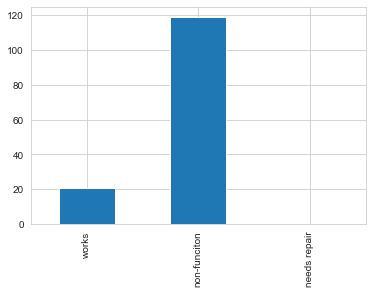

In [567]:
ax = df_data[(df_data['region']== 'Mara') & (df_data['permit']==False)]['target'].value_counts().reindex([0,1,2]).plot(
                                            kind='bar')
ax.set_xticklabels(['works','non-funciton','needs repair'])


In [568]:
"""
pivoting features
analyze our feature corelations by pivoting features against each other
no NaN
 for features which are categorical (Sex), ordinal (Pclass) or discrete (SibSp, Parch) type

"""

df_data[["funder", "target"]].groupby(['funder'], as_index=False).mean().sort_values(
        by='target', ascending=False)

,funder,target
473,Morad,2.000000
615,Rilayo Water Project,2.000000
348,Kiuma,2.000000
601,Rc Msufi,2.000000
340,Kilimo,2.000000
805,Villegers,2.000000
24,Agt Church,2.000000
270,Idf,2.000000
591,Railway,2.000000
505,Mzee Mabena,2.000000


In [569]:
df_data[["management", "target"]].groupby(['management'], as_index=False).mean().sort_values(
        by='target', ascending=False)

,management,target
4,trust,0.846154
0,company,0.655712
1,other,0.619231
6,vwc,0.541524
5,unknown,0.533333
2,parastatal,0.532468
7,water authority,0.472426
10,wug,0.381818
9,wua,0.361614
8,water board,0.310401


<Figure size 1080x720 with 0 Axes>

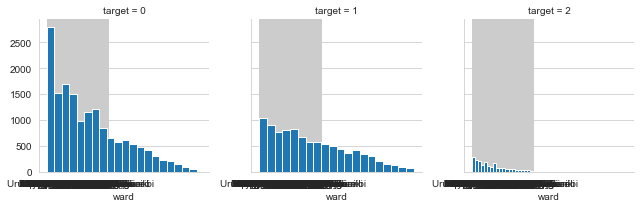

In [570]:
plt.figure(figsize=(15,10))
g = sns.FacetGrid(df_data, col='target')
g.map(plt.hist, 'ward', bins=20)

In [571]:
df_data.columns

Index(['id', 'amount_tsh', 'date_recorded', 'funder', 'gps_height',
       'installer', 'longitude', 'latitude', 'wpt_name', 'num_private',
       'basin', 'subvillage', 'region', 'region_code', 'district_code', 'lga',
       'ward', 'population', 'public_meeting', 'recorded_by',
       'scheme_management', 'scheme_name', 'permit', 'construction_year',
       'extraction_type', 'extraction_type_group', 'extraction_type_class',
       'management', 'management_group', 'payment', 'payment_type',
       'water_quality', 'quality_group', 'quantity', 'quantity_group',
       'source', 'source_type', 'source_class', 'waterpoint_type',
       'waterpoint_type_group', 'target', 'year'],
      dtype='object')

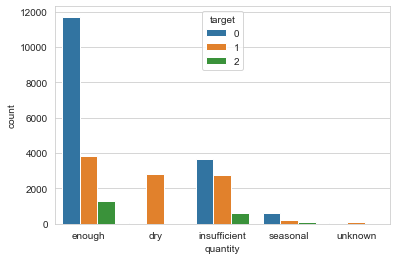

In [572]:
"""
It can be seen obviously that although there are enough water quantity in some wells, they are non-functional. 
When looking at this graph, dry quantity water points have a highly correlation with non-functionality. 
If the water point is dry or unknown, there is high chance thw water point is non functional. On the other hand, if the quantity is enough, there is a higher chance to find functional water points.
so


"""

ax = sns.countplot(x='quantity', hue="target", data=df_data);

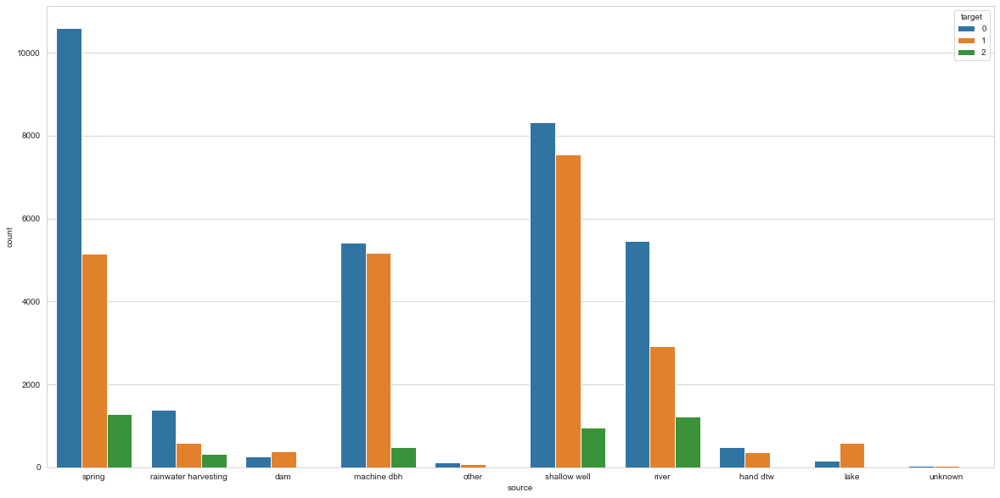

In [573]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='source', hue="target", data=df)

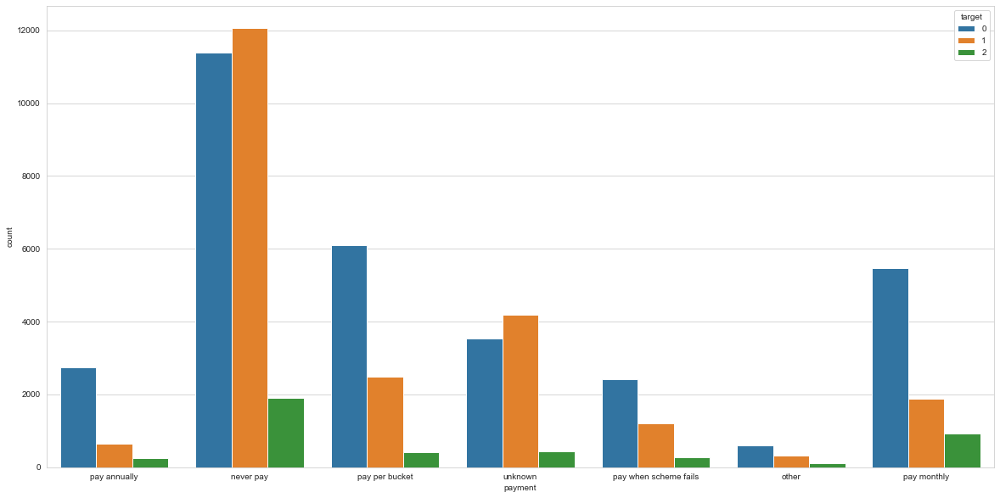

In [574]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='payment', hue="target", data=df)

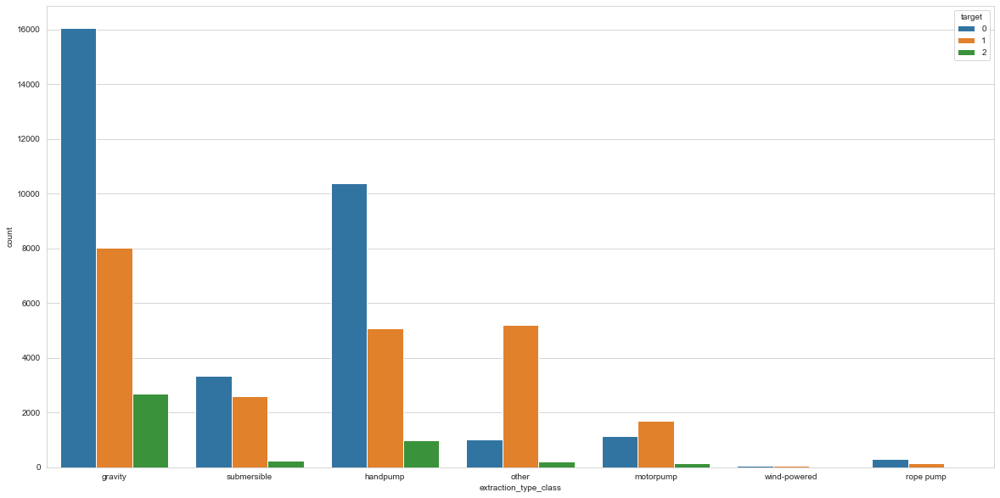

In [575]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='extraction_type_class', hue="target", data=df)


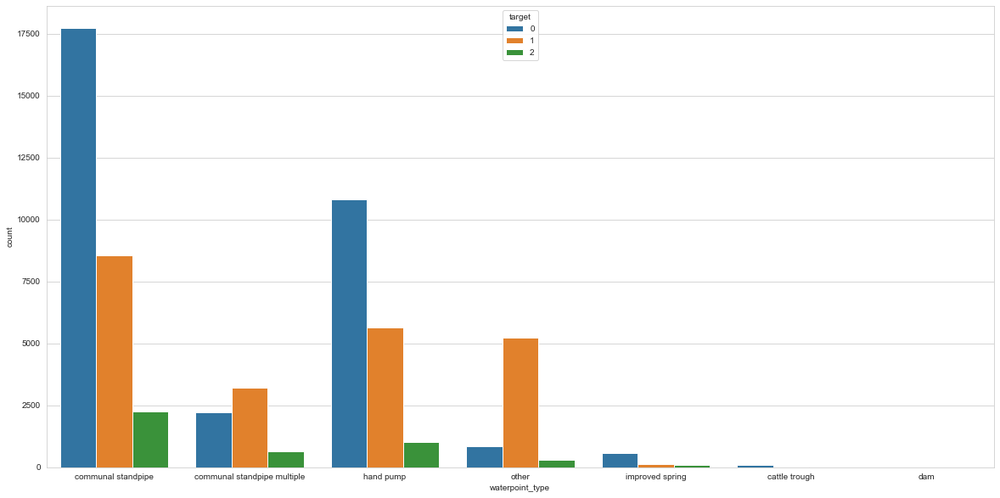

In [576]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='waterpoint_type', hue="target", data=df)

In [577]:
df_1 = pd.read_csv('data/water_table.csv')
labels = pd.read_csv('data/water_table_labels.csv')

In [578]:
labels.head()

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional


In [579]:
df_1['target'] = labels['status_group']

In [580]:
df_1.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,target
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


In [581]:
df_1.isna().sum()

id                           0
amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

In [582]:
df_1['funder'].value_counts(dropna=False)

Government Of Tanzania            9084
NaN                               3635
Danida                            3114
Hesawa                            2202
Rwssp                             1374
World Bank                        1349
Kkkt                              1287
World Vision                      1246
Unicef                            1057
Tasaf                              877
District Council                   843
Dhv                                829
Private Individual                 826
Dwsp                               811
0                                  777
Norad                              765
Germany Republi                    610
Tcrs                               602
Ministry Of Water                  590
Water                              583
Dwe                                484
Netherlands                        470
Hifab                              450
Adb                                448
Lga                                442
Amref                    

In [583]:
funder_isna = df[df_1['funder'].isna()]
funder_isna

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,target,year
34,41583,0.0,2011-02-23,NaN,-41,NaN,39.812912,-7.889986e+00,Msikitini Wa Ijumaa,0,...,salty,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,0,2011
43,19282,0.0,2013-01-15,NaN,1642,NaN,34.967789,-4.628921e+00,Mvae Primary,0,...,unknown,dry,dry,machine dbh,borehole,groundwater,communal standpipe,communal standpipe,1,2013
47,13620,0.0,2011-07-27,NaN,0,NaN,33.540607,-9.172905e+00,Mahakamani,0,...,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,0,2011
65,51072,0.0,2013-02-09,NaN,1415,NaN,34.621598,-5.173136e+00,Nyambi,0,...,unknown,dry,dry,machine dbh,borehole,groundwater,communal standpipe,communal standpipe,1,2013
71,17386,0.0,2011-03-31,NaN,0,NaN,34.462228,-8.575780e+00,Kwa Manyusi Mlilo,0,...,good,insufficient,insufficient,river,river/lake,surface,communal standpipe,communal standpipe,1,2011
72,41609,0.0,2011-04-04,NaN,0,NaN,34.247180,-8.607513e+00,Kwa Mzee Mwalongo,0,...,good,seasonal,seasonal,river,river/lake,surface,communal standpipe,communal standpipe,1,2011
75,62971,0.0,2011-08-07,NaN,0,NaN,31.796873,-1.351486e+00,Kwa Jackson,0,...,good,insufficient,insufficient,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,1,2011
109,7116,0.0,2011-07-12,NaN,0,NaN,33.805081,-9.130674e+00,Kwa Mzee Kaiga,0,...,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,0,2011
124,14016,0.0,2011-04-07,NaN,0,NaN,33.873104,-9.290616e+00,Busekele,0,...,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,0,2011
126,73061,50.0,2013-02-14,NaN,1455,NaN,34.710643,-5.186766e+00,Aley Mak8Ta,0,...,good,insufficient,insufficient,machine dbh,borehole,groundwater,communal standpipe,communal standpipe,0,2013


In [584]:
from IPython.display import IFrame
documentation = IFrame(src='https://python-visualization.github.io/folium/', width=1000, height=500)
display(documentation)

In [585]:
import folium
from folium import plugins
import ipywidgets
import geocoder
import geopy

In [586]:
#folium.Map()

In [587]:
# map1 = folium.Map(location=[34.938093,-9.856322], zoom_start=12, width=500, height=300, control_scale=True)
# map1

In [588]:
#loction-where you want map t obe centered
#zoom_start-the smaller the # the more map will be zoomed out
#    larger #, the map will be zoomed in 
#     1 it zooms way out
print('-----')
# m=folium.Map(location=[34.698766,-2.14746],zoom_start=12, width=500, height=300, control_scale=True)
# m

-----


In [589]:
"""
resize map
"""
from branca.element import Figure

# fig = Figure(width=500, height=300)
# fig.add_child(m)

In [590]:
"""
save map



"""
# m1=folium.Map(location=[34.698766,-2.14746],zoom_start=12, width=500, height=300, control_scale=True)
# m1.save('/Users/davidtorres/Flatiron_041320/Practice_Notebooks/m1.html')

'\nsave map\n\n\n\n'

In [591]:
pwd

'/Users/davidtorres/Flatiron_041320/dsc-mod-3-project-v2-1-onl01-dtsc-pt-041320'

In [592]:
# show map types using ipywidgets

# widget
# select_widget=ipywidgets.Select(
#     options=['Open Street Map', 'Terrain', 'Toner', 'Watercolor', 'Positron', 'Dark Matter'],
#     value='Open Street Map',
#     description='Map Type:',
#     disabled=False)

# # widget function
# def select(map_type):
#     if map_type == 'Open Street Map':
#         display(folium.Map(location=[34.698766,-2.14746], zoom_start=12, height=500))
#     if map_type == 'Terrain':
#         display(folium.Map(location=[34.698766,-2.14746], tiles='Stamen Terrain', zoom_start=12, height=400))
#     if map_type == 'Toner':
#         display(folium.Map(location=[34.698766,-2.14746], tiles='Stamen Toner', zoom_start=12, height=400))
#     if map_type == 'Watercolor':
#         display(folium.Map(location=[34.698766,-2.14746], tiles='Stamen Watercolor', zoom_start=12, height=400))
#     if map_type == 'Positron':
#         display(folium.Map(location=[34.698766,-2.14746], tiles='CartoDB Positron', zoom_start=12, height=400))
#     if map_type == 'Dark Matter':
#         display(folium.Map(location=[34.698766,-2.14746], tiles='CartoDB Dark_Matter', zoom_start=12, height=400))
        
# # interaction between widgets and function    
# ipywidgets.interact(select, map_type=select_widget)
